# Linear Regression(Hard Work Pays Off)

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import csv

In [2]:

dfx = pd.read_csv('./Linear_X_Train.csv')
dfy = pd.read_csv('./Linear_Y_train.csv')

In [3]:
x = dfx.values
y = dfy.values

print(x.shape)
print(y.shape)

(3750, 1)
(3750, 1)


# Visualise and Preprocess

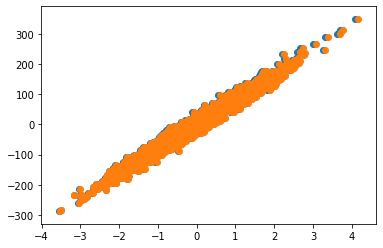

In [4]:
plt.scatter(x,y)
X = (x-x.mean())/x.std()
Y = y
plt.scatter(X,Y)
plt.show()

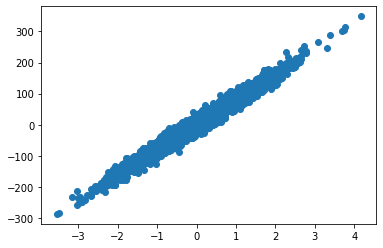

In [5]:
plt.scatter(X,Y)
plt.show()

# Algorithm

# Gradient Algorithm

1. start with a random theta
2. Repeat unitl coverage
    - Update theta acc to the rule

In [6]:
def hypothesis(x, theta): 
    return theta[0] + theta[1]*x                    # eqn of lime y= c + mx

def error(X, Y, theta):
    
    m = X.shape[0]
    error = 0
    
    for i in range(m):
        hx = hypothesis(X[i], theta)
        error += (hx - Y[i])**2
    return error

# ALgorithm

def gradient(X , Y, theta):                              # to get grad[0] and grad[1]
    
    grad = np.zeros((2,))
    m = X.shape[0]
    for i in range(m):
        hx = hypothesis(X[i], theta)
        grad[0] += (hx - Y[i])
        grad[1] += (hx- Y[i])*X[i]
    
    return grad
    
    

def gradientDescent(X ,Y, learning_rate = 0.00001):
    
    theta = np.zeros((2, ))
    
    itr = 0
    max_itr = 300
    error_list = []
    while(itr<= max_itr):
        e = error(X,Y,theta)
        error_list.append(e)
        grad = gradient(X,Y,theta)
        theta[0] = theta[0] - learning_rate*grad[0]
        theta[1] = theta[1] - learning_rate*grad[1]
        itr+=1
        
    return theta, error_list
        

In [7]:
final_theta, error_list = gradientDescent(X, Y)

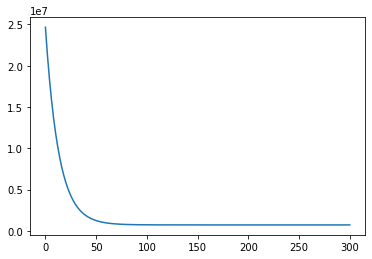

[ 0.68386207 79.90493119]


In [8]:
plt.plot(error_list)
plt.show()
print(final_theta)

# Plotting the line

In [9]:
dftest = pd.read_csv("./Linear_X_Test.csv")

In [10]:
XT = dftest.values

print(XT.shape)


(1250, 1)


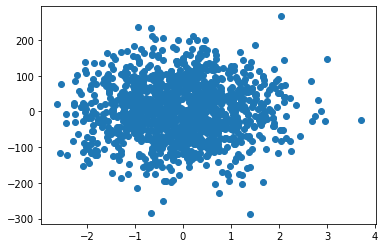

In [11]:
plt.scatter(XT,Y[:1250,])
plt.show()

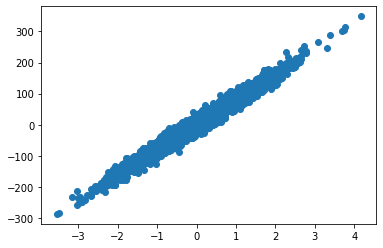

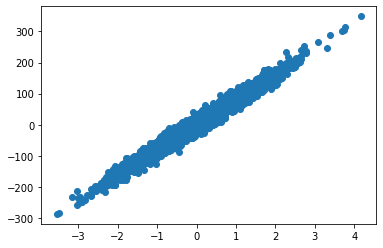

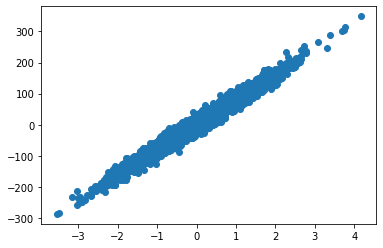

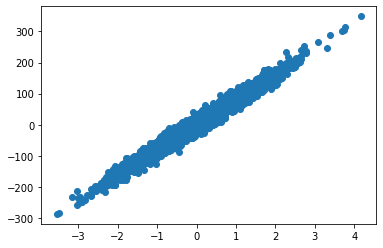

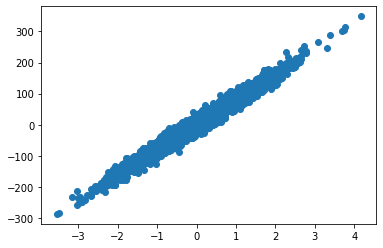

...

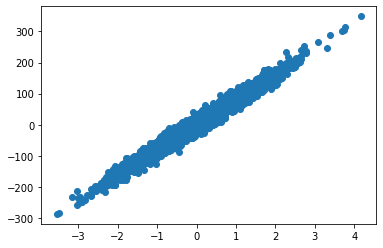

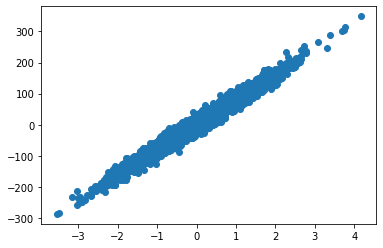

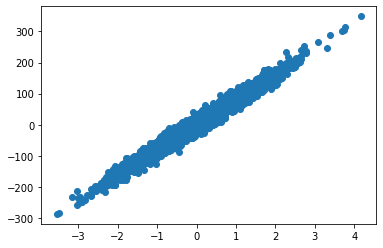

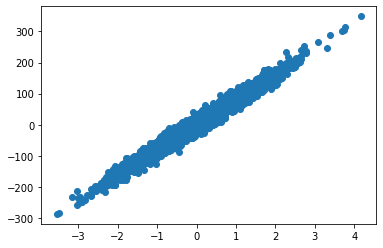

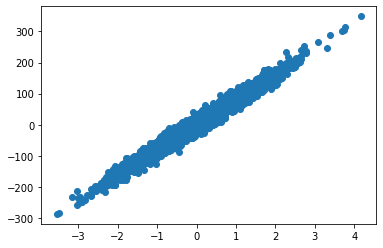

In [12]:
for i in range(XT.shape[0]):
    
    xtest = XT[i]
    plt.scatter(X, Y)
    plt.plot(xtest, hypothesis(xtest, final_theta), color = "orange")
    plt.show()
    
    

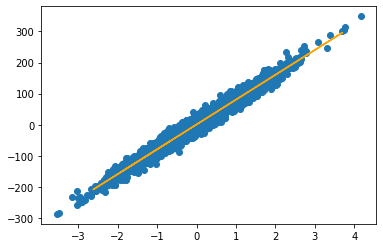

In [13]:
xtest = XT
plt.scatter(X, Y)
plt.plot(xtest, hypothesis(xtest, final_theta), color = "orange")
plt.show()

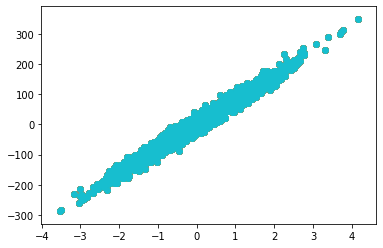

In [14]:
outcome = {"y" : []}
for i in range(XT.shape[0]):   
    
    xtest = XT[i]
    plt.scatter(X, Y)
    ans = hypothesis(xtest, final_theta)
    outcome["y"].append(ans)
    

In [15]:
print(outcome)

{'y': [array([-149.37315712]), array([-68.75607337]), array([-201.49019047]), array([221.2378884]), array([47.90768674]), array([-102.84100442]), array([-15.04366621]), array([24.02228327]), array([-64.97346879]), array([-119.2986929]), array([-13.59948352]), array([6.45275486]), array([-39.63839521]), array([64.69882835]), array([8.54508813]), array([-12.39042714]), array([23.26981448]), array([103.85754033]), array([172.80663084]), array([19.89754457]), array([-33.8475032]), array([18.99834138]), array([-55.09338525]), array([-148.85633768]), array([65.98171538]), array([106.22891985]), array([151.04536516]), array([8.72630438]), array([31.35885836]), array([-94.27993545]), array([127.32548997]), array([60.75656455]), array([-22.08741054]), array([115.86185663]), array([163.13602663]), array([-91.85141778]), array([-152.93207001]), array([7.77144552]), array([-43.2545531]), array([23.66113634]), array([33.84208593]), array([2.90441812]), array([21.13103567]), array([133.56418267]), a

In [41]:
people = pd.DataFrame(outcome)
people.to_csv('./Pred/prediction2.csv' , index=False)